<a href="https://colab.research.google.com/github/HungPham2002/E-Commerce---Customer-Churn-Prediction/blob/main/CustomerChurn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#SETTING UP THE ENVIRONMENT

## LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pandas_profiling.profile_report as report
%matplotlib inline
import seaborn as sns
import plotly
import plotly.graph_objs as go
import plotly.express as px
import plotly.graph_objects as go
from plotly import offline
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')
import pickle

##Model Building Libraries

In [2]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report

from sklearn.ensemble import VotingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score 
from sklearn.metrics import f1_score, precision_score, recall_score, fbeta_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import KFold
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics
from sklearn.metrics import classification_report, precision_recall_curve
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import make_scorer, recall_score, log_loss
from sklearn.metrics import average_precision_score
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix
#!pip install scikit-plot
from sklearn.metrics import roc_curve, auc

##Model Explainability Liberaries

### Importing libraries that is not in Colaboratory

In [ ]:
# !pip install shap
# !pip install lime
# !pip install eli5
# !pip install matplotlib==3.4.3
# !pip install -U pdpbox
# !pip install --upgrade scikit-learn

In [4]:
import xgboost
import shap
from lime.lime_tabular import LimeTabularExplainer
import eli5
from eli5.sklearn import PermutationImportance
from matplotlib.pyplot import figure
%matplotlib inline
from matplotlib import pyplot as plt
from pdpbox import pdp, get_dataset, info_plots
# libraries used to explain how machine learning models work and why they make certain predictions. 
# These libraries help us better understand how machine learning models make predictions and why they produce specific outcomes.

# LOADING THE DATASET

In [5]:
df = pd.read_csv('/content/drive/MyDrive/E-Commerce/dataset/telecom_customer_churn.csv')

# DATA PREPROCESSING (CLEAN DATA)

In [6]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# Dealing with nulls
df.columns=df.columns.str.replace(" ","").str.lower()
df.avgmonthlylongdistancecharges=df.avgmonthlylongdistancecharges.fillna(0.0)
df.multiplelines=df.multiplelines.fillna('no phone service')
no_internet=['internettype','onlinesecurity','onlinebackup','deviceprotectionplan','premiumtechsupport','streamingtv',
             'streamingmovies','streamingmusic','unlimiteddata']
df[no_internet]=df[no_internet].fillna('no internet service')
df.avgmonthlygbdownload=df.avgmonthlygbdownload.fillna(0)
###
# Since the company provides two main services, i.e., Phone Service and Internet Service, it is not necessary for every customer to avail of both services. 
# This can result in null values in the dataset when customers do not use a particular service.
# replaced the null values in features related to phone service with "No phone service" for customers who only use internet services. 
# Similarly, for features related to internet services, null values were replaced with "No internet service" for customers who only use phone services.
# Replacing null values helps increase the completeness of the dataset and makes it easier to analyze and process the data.

In [8]:
# Droping features that are of no importance for the my objective, I have dropped geographical features after finding no correlation with other features, 
# and also the columns like churn category and churn reason are out of the scope of machine learning model
df=df.drop(columns=['customerid','churncategory','churnreason','totalrefunds','zipcode','longitude','latitude','city'])

In [9]:
df.shape

(7043, 30)

In [10]:
df.isnull().sum()

gender                           0
age                              0
married                          0
numberofdependents               0
numberofreferrals                0
tenureinmonths                   0
offer                            0
phoneservice                     0
avgmonthlylongdistancecharges    0
multiplelines                    0
internetservice                  0
internettype                     0
avgmonthlygbdownload             0
onlinesecurity                   0
onlinebackup                     0
deviceprotectionplan             0
premiumtechsupport               0
streamingtv                      0
streamingmovies                  0
streamingmusic                   0
unlimiteddata                    0
contract                         0
paperlessbilling                 0
paymentmethod                    0
monthlycharge                    0
totalcharges                     0
totalextradatacharges            0
totallongdistancecharges         0
totalrevenue        

In [11]:
# To avoid the biasness in the predictions i have dropped the customers information that joined the company recently
df=df.loc[~df.customerstatus.str.contains('Join')]
df.reset_index(drop=True,inplace=True)

In [12]:
df.shape

(6589, 30)

# EXPLORATORY ANALYSIS

In [13]:
# Exploratory analysis is the process of discovering and understanding data in a general and intuitive way.
# Exploratory analysis is often the first step in the data analysis process 
# and provides critical information for determining appropriate outcomes and models to apply to the data.

In [14]:
type_ = ["No", "yes"]
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Pie(labels=type_, values=df['customerstatus'].value_counts(), name="customerstatus"))

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Churn Distributions",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Churn', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

In [15]:
df.customerstatus[df.customerstatus == 'Stayed'].groupby(by = df.gender).count()

gender
Female    2338
Male      2382
Name: customerstatus, dtype: int64

In [16]:
df.customerstatus[df.customerstatus == 'Churned'].groupby(by = df.gender).count()

gender
Female    939
Male      930
Name: customerstatus, dtype: int64

In [17]:
fig = px.histogram(df, x="customerstatus", color = "contract", barmode = "group", title = "<b>Customer contract distribution<b>")
fig.update_layout(width=700, height=500, bargap=0.2)
fig.show()

## Feature Transformation and Feature Scaling

In [18]:
# Features having two uniques were replaced by 1 and 0 (yes/no,...).
# Features having more than two uniques were encoded using label encoder
# Continous features were standarized using sk-learn scaler method

In [19]:
#Create a label encoder object
le = LabelEncoder()
# Label Encoding will be used for columns with 2 or less unique 

le_count = 0
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) <= 2:
            le.fit(df[col])
            df[col] = le.transform(df[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))

5 columns were label encoded.


In [20]:
df['gender'] = [1 if each == 'Female' else 0 for each in df['gender']]

In [21]:
df.head()

,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,None,1,42.39,No,...,Yes,One Year,1,Credit Card,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,9,None,1,10.69,Yes,...,No,Month-to-Month,0,Credit Card,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,4,Offer E,1,33.65,No,...,Yes,Month-to-Month,1,Bank Withdrawal,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,Offer D,1,27.82,No,...,Yes,Month-to-Month,1,Bank Withdrawal,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,None,1,7.38,No,...,Yes,Month-to-Month,1,Credit Card,83.9,267.40,0,22.14,289.54,0


In [22]:
def encode_data(dataframe):
    if dataframe.dtype == "object":
        dataframe = LabelEncoder().fit_transform(dataframe)
    return dataframe

data = df.apply(lambda x: encode_data(x))
data.head()

,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,0,1,42.39,0,...,1,1,1,1,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,9,0,1,10.69,1,...,0,0,0,1,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,4,5,1,33.65,0,...,1,0,1,0,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,4,1,27.82,0,...,1,0,1,0,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,0,1,7.38,0,...,1,0,1,1,83.9,267.40,0,22.14,289.54,0


In [23]:
data.to_csv('/content/drive/MyDrive/E-Commerce/dataset/mycsvfile.csv',index=False)

## Splitting the Dataset into test and train

In [24]:
X = data.drop(columns = "customerstatus")
y = data["customerstatus"].values

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 4, stratify =y)

In [26]:
col=['totalcharges','avgmonthlylongdistancecharges','monthlycharge','totalrevenue','totallongdistancecharges',
     'tenureinmonths','totallongdistancecharges','totalextradatacharges']

In [27]:
scaler = StandardScaler()
X_train[col] = StandardScaler().fit_transform(X_train[col])
X_test[col] = StandardScaler().fit_transform(X_test[col])

# BUILDING MODEL WITHOUT OPTIMIZATION

In [28]:
# At first i have just used the base models and have evaluated them to check how they are performing
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Kernel SVM', SVC()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('Gaussian NB', GaussianNB()))
models.append(('Random Forest', RandomForestClassifier()))
models.append(('Decision Tree Classifier', DecisionTreeClassifier()))

In [29]:
acc_results =[]
auc_results =[]
pre_results =[]
f1_results =[]
names = []

result_col = ["Algorithm", "ROC AUC", "Accuracy", "Precision", "f1 Score"]
model_results = pd.DataFrame(columns = result_col)

i=0
# K- fold cross validation

for name, model in models:
    names.append(name)
    # kfold = model_selection.KFold(n_splits=10)
    
    cv_acc_results = model_selection.cross_val_score(model, X_train, y_train, 
                     scoring="accuracy")
    cv_auc_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="roc_auc")
    cv_pre_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="precision")
    cv_f1_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="f1")
    acc_results.append(cv_acc_results)
    auc_results.append(cv_auc_results)
    pre_results.append(cv_pre_results)
    f1_results.append(cv_f1_results)
    
    model_results.loc[i] = [name, 
                           round(cv_acc_results.mean()*100,2),
                           round(cv_auc_results.mean()*100,2),
                           round(cv_pre_results.mean()*100,2),
                           round(cv_f1_results.mean()*100,2)]
    i+=1

model_results.sort_values(by = ['ROC AUC'], ascending=False)

,Algorithm,ROC AUC,Accuracy,Precision,f1 Score
4,Random Forest,87.01,92.05,88.53,91.11
0,Logistic Regression,83.93,90.66,89.02,88.74
5,Decision Tree Classifier,81.57,77.27,87.45,86.86
1,Kernel SVM,79.27,86.18,80.52,86.63
3,Gaussian NB,76.87,86.19,91.32,82.23
2,KNN,75.43,78.87,82.60,82.90


# FINDING GOOD HYPER PARAMETERS ON ABOVE MODELS INDIVIDUALLY

## KNN

In [30]:
modelknn= KNeighborsClassifier().fit(X_train,y_train)

In [31]:
pred_trainknn = modelknn.predict(X_train)
pred_testknn=modelknn.predict(X_test)

In [32]:
acc_trainknn = accuracy_score(pred_trainknn, y_train)
acc_testknn = accuracy_score(pred_testknn, y_test)
print(f'Training accuracy {acc_trainknn: .3f}') 
print(f'Testing accuracy {acc_testknn: .3f}')

Training accuracy  0.843
Testing accuracy  0.788


### Tuning the parameters

In [33]:
tuned_parameters = [{'algorithm':['brute'],
                     'metric': ['euclidean', 'minkowski'],
                    'n_neighbors': [5, 10, 20]}] # hyperparameters to tune

clfknn = GridSearchCV(KNeighborsClassifier(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clfknn.fit(X_train, y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfknn.best_params_) # best hyperparameter balues

print("\nGrid scores:")
meansknn = clfknn.cv_results_['mean_test_score'] # mean accuracy with folds
stdsknn = clfknn.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(meansknn, stdsknn, clfknn.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 6 candidates, totalling 30 fits

Best parameters found:
{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 10}

Grid scores:
0.754 (+/-0.037) for {'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 5}
0.768 (+/-0.039) for {'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 10}
0.768 (+/-0.032) for {'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 20}
0.754 (+/-0.037) for {'algorithm': 'brute', 'metric': 'minkowski', 'n_neighbors': 5}
0.768 (+/-0.039) for {'algorithm': 'brute', 'metric': 'minkowski', 'n_neighbors': 10}
0.768 (+/-0.032) for {'algorithm': 'brute', 'metric': 'minkowski', 'n_neighbors': 20}


### Evaluating on best Found Parameters

KNeighborsClassifier(algorithm='brute', metric='euclidean', n_neighbors=20)
Results on test data
Test accuracy =  0.7820
Test precision =  0.8385
Test recall =  0.8616
Classification report:
              precision    recall  f1-score   support

           0       0.62      0.58      0.60       561
           1       0.84      0.86      0.85      1416

    accuracy                           0.78      1977
   macro avg       0.73      0.72      0.73      1977
weighted avg       0.78      0.78      0.78      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  326   235
1  196  1220

ROC curve


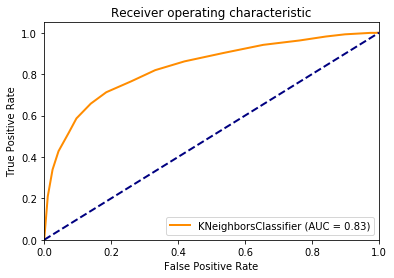

In [34]:
# Specify non-default hyper-parameter values
algorithm = 'brute'
metric = 'euclidean'
n_neighbors =  20
# Train and test model
good_modelknn = KNeighborsClassifier(algorithm=algorithm, metric=metric, 
                                  n_neighbors=n_neighbors) # create model 
print(good_modelknn) # display model parameters
good_modelknn.fit(X_train, y_train) # train model
predknn = good_modelknn.predict(X_test) # predicted output for test examples
print("Results on test data")
accknn = accuracy_score(y_test, predknn) # accuracy on test examples
precknn = precision_score(y_test, predknn) # precision on test examples
recaknn = recall_score(y_test, predknn) # recall on test examples
print(f'Test accuracy = {accknn: .4f}') # round to 4 decimal places
print(f'Test precision = {precknn: .4f}') # round to 4 decimal places
print(f'Test recall = {recaknn: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, predknn))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, predknn)))
print('\nROC curve') 
fpr, tpr, thresholds = roc_curve(y_test, good_modelknn.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='KNeighborsClassifier (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

## Logistic Regression

In [35]:
modelL=LogisticRegression()

In [36]:
modelL.fit(X_train,y_train)

LogisticRegression()

In [37]:
LogisticRegression()

LogisticRegression()

In [38]:
pred_trainL = modelL.predict(X_train)
pred_testL=modelL.predict(X_test)

In [39]:
acc_trainL = accuracy_score(pred_trainL, y_train)
acc_testL = accuracy_score(pred_testL, y_test)
print(f'Training accuracy {acc_trainL: .3f}') 
print(f'Testing accuracy {acc_testL: .3f}')

Training accuracy  0.847
Testing accuracy  0.856


### Tuning the parameters

In [40]:
tuned_parameters = [{'C': [10.0, 100.0, 1000.0, 10000.0],
                     'max_iter': [500, 1000]}] # hyperparameters to tune
clfL = GridSearchCV(LogisticRegression(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clfL.fit(X_train,y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfL.best_params_) # best hyperparameter values

print("\nGrid scores:")
meansL = clfL.cv_results_['mean_test_score'] # mean accuracy with folds
stdsL = clfL.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(meansL, stdsL, clfL.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 8 candidates, totalling 40 fits

Best parameters found:
{'C': 1000.0, 'max_iter': 500}

Grid scores:
0.844 (+/-0.030) for {'C': 10.0, 'max_iter': 500}
0.843 (+/-0.031) for {'C': 10.0, 'max_iter': 1000}
0.844 (+/-0.029) for {'C': 100.0, 'max_iter': 500}
0.842 (+/-0.030) for {'C': 100.0, 'max_iter': 1000}
0.845 (+/-0.031) for {'C': 1000.0, 'max_iter': 500}
0.843 (+/-0.030) for {'C': 1000.0, 'max_iter': 1000}
0.845 (+/-0.029) for {'C': 10000.0, 'max_iter': 500}
0.843 (+/-0.030) for {'C': 10000.0, 'max_iter': 1000}


###Evaluating on the basis of Best found parameters

LogisticRegression(C=1000, max_iter=1000)
Results on test data
Test accuracy =  0.8548
Test precision =  0.8995
Test recall =  0.8976
Classification report:
              precision    recall  f1-score   support

           0       0.74      0.75      0.74       561
           1       0.90      0.90      0.90      1416

    accuracy                           0.85      1977
   macro avg       0.82      0.82      0.82      1977
weighted avg       0.86      0.85      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  419   142
1  145  1271

ROC curve


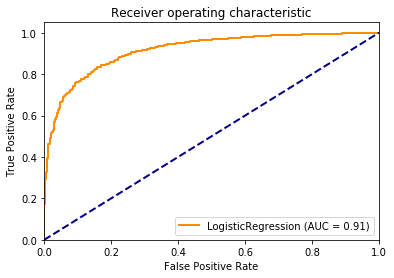

In [41]:
# Specify non-default hyper-parameter values
C = 1000
max_iter = 1000
# Train and test model
good_modelL = LogisticRegression(C = C, max_iter=max_iter) # create model 
print(good_modelL) # display model parameters
good_modelL.fit(X_train,y_train) # train model
predL = good_modelL.predict(X_test) # predicted output for test examples
print("Results on test data")
accL = accuracy_score(y_test, predL) # accuracy on test examples
precL = precision_score(y_test, predL) # precision on test examples
recaL = recall_score(y_test, predL) # recall on test examples
print(f'Test accuracy = {accL: .4f}') # round to 4 decimal places
print(f'Test precision = {precL: .4f}') # round to 4 decimal places
print(f'Test recall = {recaL: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, predL))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, predL)))
print('\nROC curve')
fpr, tpr, thresholds = roc_curve(y_test, good_modelL.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='LogisticRegression (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

## SVM

In [42]:
modelsvm=svm.SVC().fit(X_train,y_train)

In [43]:
pred_trainsvm = modelsvm.predict(X_train)
pred_testsvm=modelsvm.predict(X_test)

In [44]:
acc_trainsvm = accuracy_score(pred_trainsvm, y_train)
acc_testsvm = accuracy_score(pred_testsvm, y_test)
print(f'Training accuracy {acc_trainsvm: .3f}') 
print(f'Testing accuracy {acc_testsvm: .3f}')

Training accuracy  0.807
Testing accuracy  0.803


###Tuning The Hyper Parameters

In [45]:
tuned_parameters = [{'kernel':['linear'], 'gamma':[1], 'C':[1]}]
                     # hyperparameters to tune

clfsvm = GridSearchCV(svm.SVC(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clfsvm.fit(X_train,y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfsvm.best_params_) # best hyperparameter balues

print("\nGrid scores:")
meansvm = clfsvm.cv_results_['mean_test_score'] # mean accuracy with folds
stdsvm = clfsvm.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(meansvm, stdsvm, clfsvm.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best parameters found:
{'C': 1, 'gamma': 1, 'kernel': 'linear'}

Grid scores:
0.843 (+/-0.026) for {'C': 1, 'gamma': 1, 'kernel': 'linear'}


###Evaluating on the basis of best Parameters

SVC(C=1, gamma=0.1, kernel='linear', probability=True)
Results on test data
Test accuracy =  0.8523
Test precision =  0.9003
Test recall =  0.8927
Classification report:
              precision    recall  f1-score   support

           0       0.73      0.75      0.74       561
           1       0.90      0.89      0.90      1416

    accuracy                           0.85      1977
   macro avg       0.82      0.82      0.82      1977
weighted avg       0.85      0.85      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  421   140
1  152  1264

ROC curve


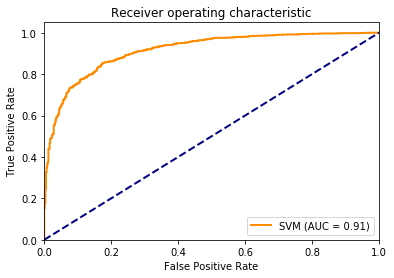

In [46]:
# Specify non-default hyper-parameter values
C = 1 # algorithm name
kernel = 'linear'# kernel type
gamma =  0.1 # kernel parameter
# Train and test model
good_modelsvm = svm.SVC(C=C, kernel=kernel, gamma=gamma, probability = True) # create model 
print(good_modelsvm) # display model parameters
good_modelsvm.fit(X_train,y_train) # train model
predsvm = good_modelsvm.predict(X_test) # predicted output for test examples
print("Results on test data")
accsvm = accuracy_score(y_test, predsvm) # accuracy on test examples
precsvm = precision_score(y_test, predsvm) # precision on test examples
recasvm = recall_score(y_test, predsvm) # recall on test examples
print(f'Test accuracy = {accsvm: .4f}') # round to 4 decimal places
print(f'Test precision = {precsvm: .4f}') # round to 4 decimal places
print(f'Test recall = {recasvm: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, predsvm))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, predsvm)))
print('\nROC curve')
fpr, tpr, thresholds = roc_curve(y_test, good_modelsvm.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='SVM (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

## Decision Tree Classifier

In [47]:
modelD= DecisionTreeClassifier()

In [48]:
modelD.fit(X_train, y_train) 

DecisionTreeClassifier()

In [49]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [50]:
pred_train_D = modelD.predict(X_train)
pred_test_D=modelD.predict(X_test)

In [51]:
acc_train_D = accuracy_score(pred_train_D, y_train)
acc_test_D = accuracy_score(pred_test_D, y_test)
print(f'Training accuracy {acc_train_D: .3f}') 
print(f'Testing accuracy {acc_test_D: .3f}')

Training accuracy  1.000
Testing accuracy  0.833


###Tuning the parameters

In [52]:
tuned_parameters = [{'criterion':['gini', 'entropy'],
                     'max_leaf_nodes': range(5,25)}] # hyperparameters to tune

clf_D = GridSearchCV(DecisionTreeClassifier(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clf_D.fit(X_train, y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clf_D.best_params_) # best hyperparameter balues

print("\nGrid scores:")
means_D = clf_D.cv_results_['mean_test_score'] # mean accuracy with folds
stds_D = clf_D.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(means_D, stds_D, clf_D.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best parameters found:
{'criterion': 'gini', 'max_leaf_nodes': 19}

Grid scores:
0.844 (+/-0.022) for {'criterion': 'gini', 'max_leaf_nodes': 5}
0.851 (+/-0.015) for {'criterion': 'gini', 'max_leaf_nodes': 6}
0.853 (+/-0.010) for {'criterion': 'gini', 'max_leaf_nodes': 7}
0.857 (+/-0.009) for {'criterion': 'gini', 'max_leaf_nodes': 8}
0.857 (+/-0.009) for {'criterion': 'gini', 'max_leaf_nodes': 9}
0.856 (+/-0.010) for {'criterion': 'gini', 'max_leaf_nodes': 10}
0.856 (+/-0.011) for {'criterion': 'gini', 'max_leaf_nodes': 11}
0.856 (+/-0.011) for {'criterion': 'gini', 'max_leaf_nodes': 12}
0.856 (+/-0.015) for {'criterion': 'gini', 'max_leaf_nodes': 13}
0.858 (+/-0.014) for {'criterion': 'gini', 'max_leaf_nodes': 14}
0.859 (+/-0.015) for {'criterion': 'gini', 'max_leaf_nodes': 15}
0.860 (+/-0.020) for {'criterion': 'gini', 'max_leaf_nodes': 16}
0.859 (+/-0.019) for {'criterion': 'gini', 'max_leaf_nodes': 17}
0.859 (+/-0.017)

### Evaluating on the basis of Best found parameters

DecisionTreeClassifier(max_leaf_nodes=19)
Results on test data
Test accuracy =  0.8553
Test precision =  0.8655
Test recall =  0.9449
Classification report:
              precision    recall  f1-score   support

           0       0.82      0.63      0.71       561
           1       0.87      0.94      0.90      1416

    accuracy                           0.86      1977
   macro avg       0.84      0.79      0.81      1977
weighted avg       0.85      0.86      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  353   208
1   78  1338

ROC curve


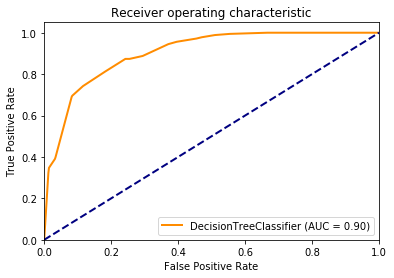

In [53]:
criterion = 'gini'
max_leaf_nodes = 19
# Train and test model
good_model_D = DecisionTreeClassifier(criterion=criterion,
                                    max_leaf_nodes=max_leaf_nodes) # create model 
print(good_model_D) # display model parameters
good_model_D.fit(X_train, y_train) # train model
pred_D = good_model_D.predict(X_test) # predicted output for test examples
print("Results on test data")
acc_D = accuracy_score(y_test, pred_D) # accuracy on test examples
prec_D = precision_score(y_test, pred_D) # precision on test examples
reca_D = recall_score(y_test, pred_D) # recall on test examples
print(f'Test accuracy = {acc_D: .4f}') # round to 4 decimal places
print(f'Test precision = {prec_D: .4f}') # round to 4 decimal places
print(f'Test recall = {reca_D: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, pred_D))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, pred_D)))
print('\nROC curve')
fpr, tpr, thresholds = roc_curve(y_test, good_model_D.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='DecisionTreeClassifier (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

##Random Forest

In [54]:
modelR = RandomForestClassifier()

In [55]:
modelR.fit(X_train, y_train) 

RandomForestClassifier()

In [56]:
RandomForestClassifier()

RandomForestClassifier()

In [57]:
pred_train = modelR.predict(X_train)
pred_test=modelR.predict(X_test)

In [58]:
acc_train = accuracy_score(pred_train, y_train)
acc_test = accuracy_score(pred_test, y_test)
print(f'Training accuracy {acc_train: .3f}') 
print(f'Testing accuracy {acc_test: .3f}')

Training accuracy  1.000
Testing accuracy  0.874


###Tuning the Parameters

In [59]:
tuned_parameters = [{'n_estimators': [25, 50, 75],
                     'max_features': [15, 20, 25],
                     'max_leaf_nodes': [8, 16, 24]}] # hyperparameters to tune

clfR = GridSearchCV(RandomForestClassifier(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clfR.fit(X_train, y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfR.best_params_) # best hyperparameter values

print("\nGrid scores:")
means = clfR.cv_results_['mean_test_score'] # mean accuracy with folds
stds = clfR.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(means, stds, clfR.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 27 candidates, totalling 135 fits

Best parameters found:
{'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 25}

Grid scores:
0.866 (+/-0.016) for {'max_features': 15, 'max_leaf_nodes': 8, 'n_estimators': 25}
0.869 (+/-0.008) for {'max_features': 15, 'max_leaf_nodes': 8, 'n_estimators': 50}
0.866 (+/-0.019) for {'max_features': 15, 'max_leaf_nodes': 8, 'n_estimators': 75}
0.869 (+/-0.008) for {'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 25}
0.871 (+/-0.016) for {'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 50}
0.871 (+/-0.010) for {'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 75}
0.871 (+/-0.011) for {'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 25}
0.869 (+/-0.014) for {'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 50}
0.870 (+/-0.010) for {'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 75}
0.867 (+/-0.014) for {'max_features': 20, 'max_leaf_nodes': 8, 'n_estimators': 25}
0

###Evaluating Random forest classifier with selected hyper-parameters

RandomForestClassifier(max_features=15, max_leaf_nodes=16, n_estimators=50)
Results on test data
Test accuracy =  0.8629
Test precision =  0.8658
Test recall =  0.9569
Classification report:
              precision    recall  f1-score   support

           0       0.85      0.63      0.72       561
           1       0.87      0.96      0.91      1416

    accuracy                           0.86      1977
   macro avg       0.86      0.79      0.82      1977
weighted avg       0.86      0.86      0.86      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  351   210
1   61  1355

ROC curve


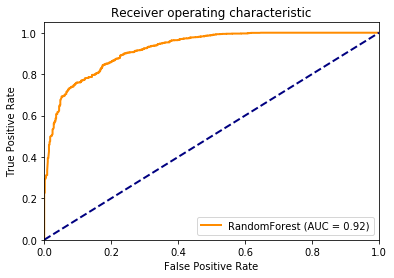

In [60]:
# Specify non-default hyper-parameter values
max_features = 15
max_leaf_nodes = 16 
n_estimators = 50
# Train and test model
good_model = RandomForestClassifier(max_leaf_nodes = max_leaf_nodes,
                                    max_features = max_features, 
                                    n_estimators=n_estimators, ) # create model 
print(good_model) # display model parameters
good_model.fit(X_train, y_train) # train model
pred = good_model.predict(X_test) # predicted output for test examples
print("Results on test data")
acc = accuracy_score(y_test, pred) # accuracy on test examples
prec = precision_score(y_test, pred) # precision on test examples
reca = recall_score(y_test, pred) # recall on test examples
print(f'Test accuracy = {acc: .4f}') # round to 4 decimal places
print(f'Test precision = {prec: .4f}') # round to 4 decimal places
print(f'Test recall = {reca: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, pred))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, pred)))
print('\nROC curve')
fpr, tpr, thresholds = roc_curve(y_test, good_model.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='RandomForest (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

#GETTING COMBINED RESULTS FROM THE TUNED MODELS

In [61]:
models_opt = []

models_opt.append(('Logistic Regression', LogisticRegression(solver='liblinear',C = 1000, max_iter=1000, random_state = 0)))
models_opt.append(('SVC', SVC(C=1, kernel = 'linear', gamma=1, random_state = 0)))
models_opt.append(('Kernel SVM', SVC(C=1, kernel = 'rbf', gamma=1, random_state = 0)))
models_opt.append(('KNN', KNeighborsClassifier(n_neighbors = 20, metric = 'euclidean', p = 2,algorithm='brute')))
models_opt.append(('Gaussian NB', GaussianNB()))
models_opt.append(('Decision Tree Classifier', DecisionTreeClassifier(criterion = 'gini', max_leaf_nodes=19, random_state = 0)))
models_opt.append(('Random Forest', RandomForestClassifier(max_leaf_nodes = 16,max_features = 15, 
                                                           n_estimators = 50,criterion = 'entropy', random_state = 0)))

In [62]:
acc_results_opt =[]
auc_results_opt =[]
pre_results_opt =[]
f1_results_opt =[]
names_opt = []

result_col_opt = ["Algorithm", "ROC AUC", "Accuracy", 'Precision', 'F1 Scores']
model_results_opt = pd.DataFrame(columns = result_col_opt)

i=0
# K- fold cross validation

for name, model in models:
    names_opt.append(name)
    kfold = model_selection.KFold(n_splits=10)
    
    cv_acc_results_opt = model_selection.cross_val_score(model, X_train, y_train, 
                    cv = kfold, scoring="accuracy")
    cv_auc_results_opt = model_selection.cross_val_score(model, X_train, y_train,
                    cv = kfold, scoring="roc_auc")
    cv_pre_results_opt = model_selection.cross_val_score(model, X_train, y_train,
                    cv = kfold, scoring="precision")
    cv_f1_results_opt = model_selection.cross_val_score(model, X_train, y_train,
                    cv = kfold, scoring="f1")
    acc_results_opt.append(cv_acc_results_opt)
    auc_results_opt.append(cv_auc_results_opt)
    pre_results_opt.append(cv_pre_results_opt)
    f1_results_opt.append(cv_f1_results_opt)
    model_results_opt.loc[i] = [name, 
                           round(cv_auc_results_opt.mean()*100,2),
                           round(cv_acc_results_opt.mean()*100,2),
                           round(cv_pre_results_opt.mean()*100,2),
                           round(cv_f1_results_opt.mean()*100,2)]
    i+=1

model_results_opt.sort_values(by = ['ROC AUC'], ascending=False)

,Algorithm,ROC AUC,Accuracy,Precision,F1 Scores
4,Random Forest,92.05,87.06,88.25,91.09
0,Logistic Regression,90.72,83.93,89.10,88.72
1,Kernel SVM,86.49,79.81,81.45,86.84
3,Gaussian NB,86.24,76.89,91.13,82.28
2,KNN,79.60,76.08,82.78,83.42
5,Decision Tree Classifier,77.37,81.70,87.46,87.03


# TESTING MODEL PERFORMENCES ON TEST DATA

In [63]:
acc_results_opt =[]
auc_results_opt =[]
pre_results_opt =[]
f1_results_opt =[]
names_opt = []

result_col_opt = ["Algorithm", "ROC AUC", "Accuracy", 'Precision', 'F1 Scores']
model_results_opt = pd.DataFrame(columns = result_col_opt)

i=0
# K- fold cross validation

for name, model in models:
    names_opt.append(name)
    kfold = model_selection.KFold(n_splits=10)
    
    cv_acc_results_opt = model_selection.cross_val_score(model, X_test, y_test, 
                    cv = kfold, scoring="accuracy")
    cv_auc_results_opt = model_selection.cross_val_score(model, X_test, y_test,
                    cv = kfold, scoring="roc_auc")
    cv_pre_results_opt = model_selection.cross_val_score(model, X_test, y_test,
                    cv = kfold, scoring="precision")
    cv_f1_results_opt = model_selection.cross_val_score(model, X_test, y_test,
                    cv = kfold, scoring="f1")
    acc_results_opt.append(cv_acc_results_opt)
    auc_results_opt.append(cv_auc_results_opt)
    pre_results_opt.append(cv_pre_results_opt)
    f1_results_opt.append(cv_f1_results_opt)
    model_results_opt.loc[i] = [name, 
                           round(cv_auc_results_opt.mean()*100,2),
                           round(cv_acc_results_opt.mean()*100,2),
                           round(cv_pre_results_opt.mean()*100,2),
                           round(cv_f1_results_opt.mean()*100,2)]
    i+=1

model_results_opt.sort_values(by = ['ROC AUC'], ascending=False)

,Algorithm,ROC AUC,Accuracy,Precision,F1 Scores
4,Random Forest,91.90,86.34,87.79,90.93
0,Logistic Regression,90.83,84.22,88.95,88.94
3,Gaussian NB,85.89,76.23,90.36,81.82
1,Kernel SVM,85.55,72.39,72.29,83.77
5,Decision Tree Classifier,78.37,82.15,88.29,86.95
2,KNN,78.20,74.91,81.50,82.75


#RANDOM FOREST vs NEUTRAL NETWORK

##Libraries

In [64]:
import numpy as np 
import pandas as pd 
from matplotlib import pyplot as plt 
from sklearn.model_selection import train_test_split 
from tensorflow import keras
from keras.models import Sequential 
from keras.layers import InputLayer 
from keras.layers import Dense 
from keras.layers import Dropout 
from keras.constraints import maxnorm
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

##Neural Network

In [65]:
# the data is in tabular format and therefore a simple architecture is used to prevent overfitting. 
# The neural network has two dense layers with 64 and 8 neurons respectively and uses the relu activation function. 
# A dropout layer is included with a 20% rate to prevent overfitting. 
# The kernel_constraint parameter is used to scale the weights in the network. The final layer is a dense layer with 1 neuron and sigmoid activation function.

In [66]:
model = Sequential()
model.add(Dense(64, input_dim=29, activation='relu', kernel_constraint=maxnorm(3)))
model.add(Dropout(rate=0.2))
model.add(Dense(8, activation='relu', kernel_constraint=maxnorm(3)))
model.add(Dropout(rate=0.2))
model.add(Dense(1, activation='sigmoid'))

In [67]:
# compiling the model using binary_crossentropy as the loss function, adam as the optimizer and accuracy metric to track during training.

In [68]:
model.compile(loss = "binary_crossentropy", optimizer = 'adam', metrics=['accuracy'])

In [69]:
# training the model for 50 epochs with a batch size value of 8. 
# One epoch is when an entire dataset is passed forward and backward through the neural network only once. 
# Batch size is the total number of training examples present in a single batch.

In [70]:
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50, batch_size=8)

Epoch 1/50
577/577 [==============================] - 3s 3ms/step - loss: 0.6868 - accuracy: 0.7025 - val_loss: 0.4618 - val_accuracy: 0.7162
Epoch 2/50
577/577 [==============================] - 2s 3ms/step - loss: 0.4663 - accuracy: 0.7385 - val_loss: 0.4280 - val_accuracy: 0.7537
Epoch 3/50
577/577 [==============================] - 2s 4ms/step - loss: 0.4381 - accuracy: 0.7736 - val_loss: 0.3855 - val_accuracy: 0.8164
Epoch 4/50
577/577 [==============================] - 2s 3ms/step - loss: 0.4100 - accuracy: 0.7951 - val_loss: 0.3899 - val_accuracy: 0.8250
Epoch 5/50
577/577 [==============================] - 1s 2ms/step - loss: 0.3962 - accuracy: 0.8068 - val_loss: 0.3635 - val_accuracy: 0.8381
Epoch 6/50
577/577 [==============================] - 1s 2ms/step - loss: 0.3916 - accuracy: 0.8140 - val_loss: 0.3602 - val_accuracy: 0.8295
Epoch 7/50
577/577 [==============================] - 1s 3ms/step - loss: 0.3817 - accuracy: 0.8135 - val_loss: 0.3617 - val_accuracy: 0.8412
Epoch 

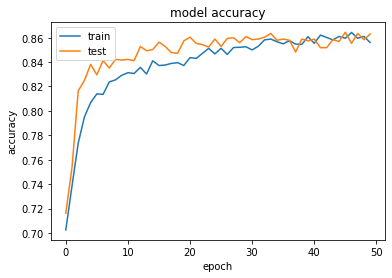

62/62 [==============================] - 0s 1ms/step
ROC AUC: 0.9229835745289384
val_accuracy [0.7162367105484009, 0.7536671757698059, 0.8163884878158569, 0.8249873518943787, 0.8381385803222656, 0.8295397162437439, 0.8411734700202942, 0.8351036906242371, 0.8421851396560669, 0.8416793346405029, 0.8421851396560669, 0.8411734700202942, 0.8528072834014893, 0.8492665886878967, 0.8502781987190247, 0.8563479781150818, 0.8528072834014893, 0.8477491140365601, 0.8472433090209961, 0.8573596477508545, 0.8603945374488831, 0.8553363680839539, 0.8543247580528259, 0.8523014783859253, 0.8588770627975464, 0.8528072834014893, 0.8593829274177551, 0.8598887324333191, 0.8558421730995178, 0.860900342464447, 0.8583712577819824, 0.8588770627975464, 0.8603945374488831, 0.8634294271469116, 0.8578654527664185, 0.8588770627975464, 0.8578654527664185, 0.848254919052124, 0.8588770627975464, 0.8573596477508545, 0.8588770627975464, 0.8517956733703613, 0.8517956733703613, 0.8583712577819824, 0.8568538427352905, 0.86444

In [71]:
plt.plot(history.history['accuracy']) 
plt.plot(history.history['val_accuracy']) 
plt.title('model accuracy') 
plt.ylabel('accuracy')
plt.xlabel('epoch') 
plt.legend(['train', 'test'], loc='upper left') 
plt.show()
from sklearn.metrics import roc_auc_score, precision_score, f1_score

# Predict on data test
y_pred = model.predict(X_test)

# Convert prediction from probability into binary label
y_pred_bin = [1 if i >= 0.5 else 0 for i in y_pred]

# calc ROC AUC
roc_auc = roc_auc_score(y_test, y_pred)

# calc Precision
precision = precision_score(y_test, y_pred_bin)

# calc F1 Scores
f1_scores = f1_score(y_test, y_pred_bin)

print("ROC AUC:", roc_auc)
print("val_accuracy",history.history['val_accuracy'])
print("Precision:", precision)
print("F1 Scores:", f1_scores)


In [72]:
# The test accuracy of the neural network after 50 epochs is 86%

## Getting combined results Random Forest vs Neural Network and others

In [73]:
acc_results_opt =[]
auc_results_opt =[]
pre_results_opt =[]
f1_results_opt =[]
names_opt = []

result_col_opt = ["Algorithm", "ROC AUC", "Accuracy", 'Precision', 'F1 Scores']
model_results_opt = pd.DataFrame(columns = result_col_opt)

i=0
# K- fold cross validation

for name, model in models:
    names_opt.append(name)
    kfold = model_selection.KFold(n_splits=10)
    
    cv_acc_results_opt = model_selection.cross_val_score(model, X_train, y_train, 
                    cv = kfold, scoring="accuracy")
    cv_auc_results_opt = model_selection.cross_val_score(model, X_train, y_train,
                    cv = kfold, scoring="roc_auc")
    cv_pre_results_opt = model_selection.cross_val_score(model, X_train, y_train,
                    cv = kfold, scoring="precision")
    cv_f1_results_opt = model_selection.cross_val_score(model, X_train, y_train,
                    cv = kfold, scoring="f1")
    acc_results_opt.append(cv_acc_results_opt)
    auc_results_opt.append(cv_auc_results_opt)
    pre_results_opt.append(cv_pre_results_opt)
    f1_results_opt.append(cv_f1_results_opt)
    model_results_opt.loc[i] = [name, 
                           round(cv_auc_results_opt.mean()*100,2),
                           round(cv_acc_results_opt.mean()*100,2),
                           round(cv_pre_results_opt.mean()*100,2),
                           round(cv_f1_results_opt.mean()*100,2)]
    model_results_opt.loc[6] = ['Neural Network', 
                       round(roc_auc*100,2),
                       round(history.history['accuracy'][-1]*100,2),
                       round(precision*100,2),
                       round(f1_scores*100,2)]
    i+=1

model_results_opt.sort_values(by = ['ROC AUC'], ascending=False)

,Algorithm,ROC AUC,Accuracy,Precision,F1 Scores
6,Neural Network,92.30,85.60,87.99,90.73
4,Random Forest,92.13,86.97,88.44,91.16
0,Logistic Regression,90.72,83.93,89.10,88.72
1,Kernel SVM,86.49,79.81,81.45,86.84
3,Gaussian NB,86.24,76.89,91.13,82.28
2,KNN,79.60,76.08,82.78,83.42
5,Decision Tree Classifier,77.63,81.33,87.53,87.41


# EXPLAINING EVALUATED MODELS (Model interpretation - using different methods)

### Applying Permutation Importance on Random Forest

In [74]:
perm = PermutationImportance(good_model, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0554 ± 0.0071,tenureinmonths
0.0475 ± 0.0088,contract
0.0241 ± 0.0098,numberofreferrals
0.0183 ± 0.0062,monthlycharge
0.0138 ± 0.0118,age
0.0076 ± 0.0054,numberofdependents
0.0044 ± 0.0018,totalrevenue
0.0036 ± 0.0048,onlinesecurity
0.0014 ± 0.0040,totalcharges
0.0011 ± 0.0029,internettype


### Applying Partial distance Plots (PDP) on Random Forest (explaining more detail)

In [75]:
from sklearn.ensemble import RandomForestRegressor
data1 = data.query('monthlycharge >= 0')
y1 = data.customerstatus
base_features=['tenureinmonths','contract','numberofreferrals','age','numberofdependents','monthlycharge']
X1 = data[base_features]
train_X1, val_X1, train_y1, val_y1 = train_test_split(X1, y1, random_state=1)
first_model = RandomForestRegressor(n_estimators=50, random_state=1).fit(train_X1, train_y1)
print("Data sample:")
data.head()

Data sample:


,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,0,1,42.39,0,...,1,1,1,1,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,9,0,1,10.69,1,...,0,0,0,1,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,4,5,1,33.65,0,...,1,0,1,0,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,4,1,27.82,0,...,1,0,1,0,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,0,1,7.38,0,...,1,0,1,1,83.9,267.40,0,22.14,289.54,0


In [79]:
from matplotlib.pyplot import figure
%matplotlib inline
from matplotlib import pyplot as plt
from pdpbox import pdp, get_dataset, info_plots

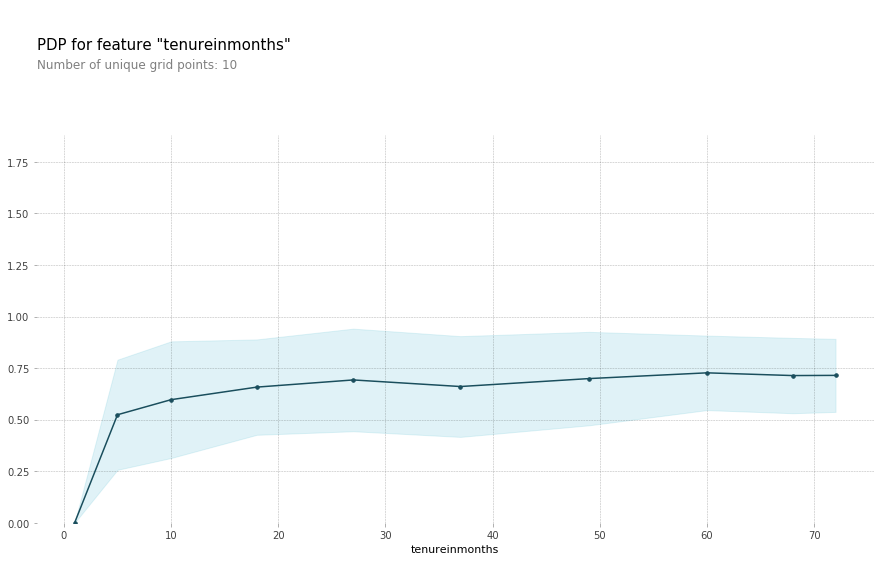

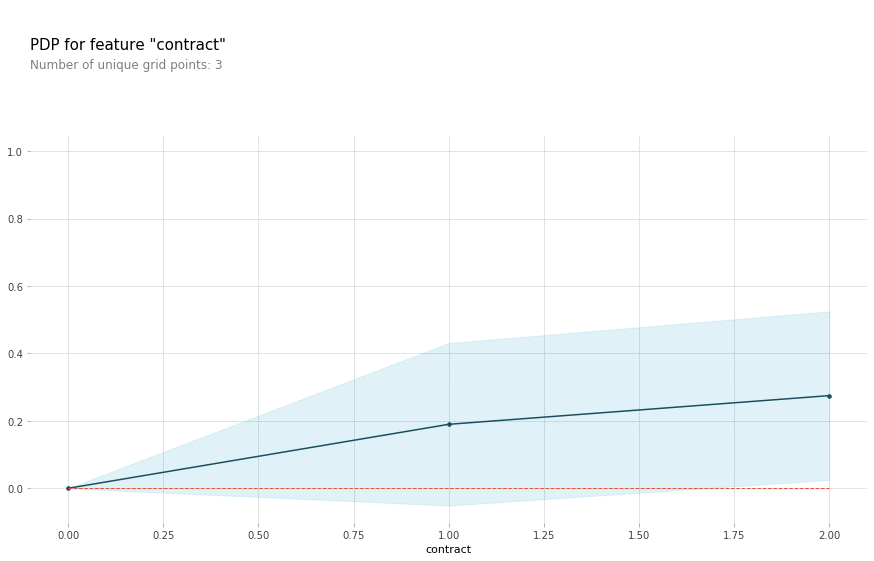

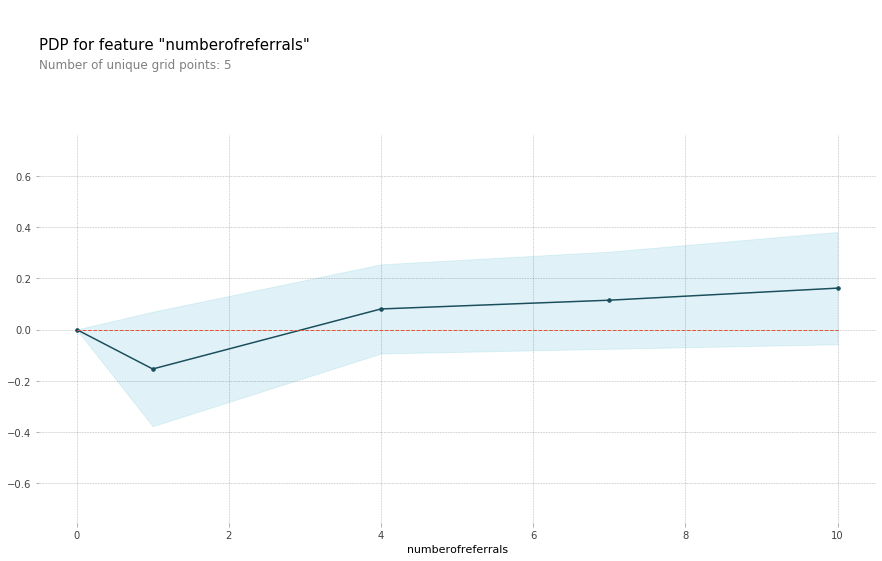

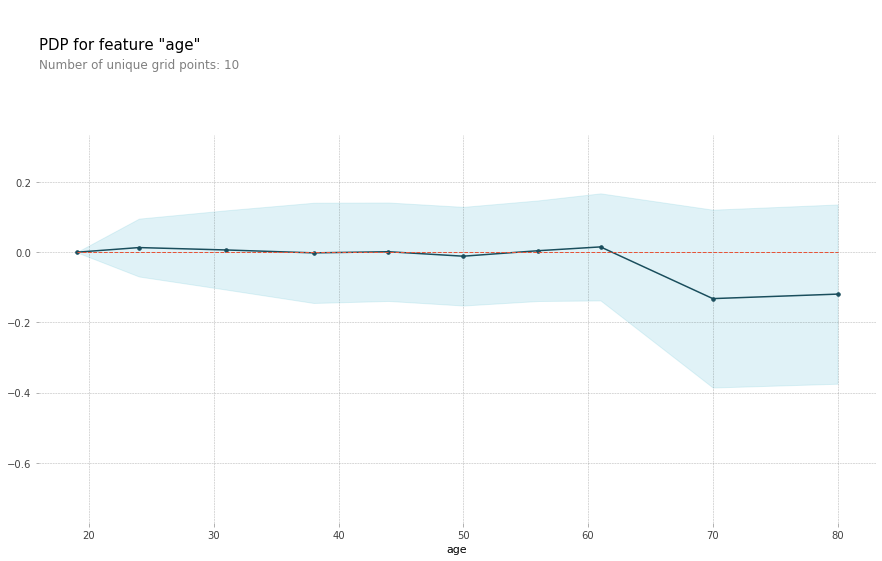

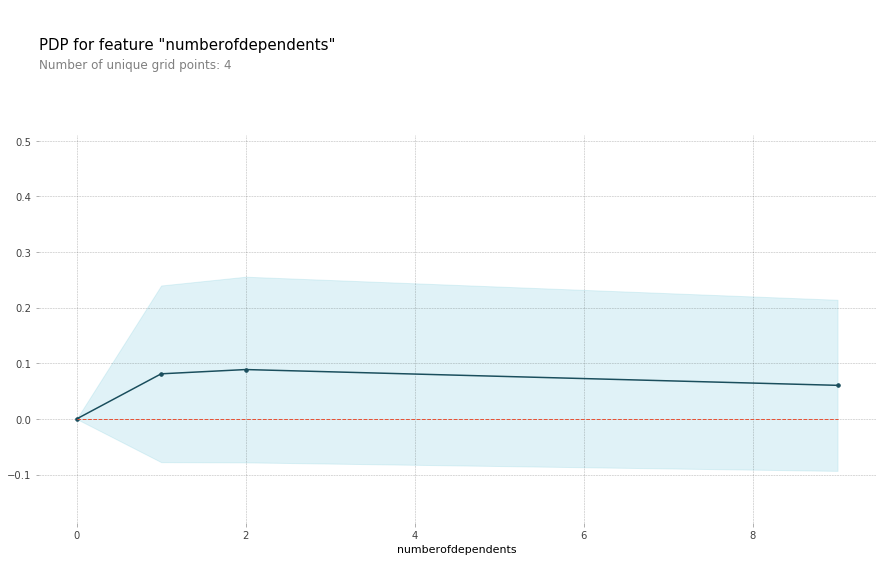

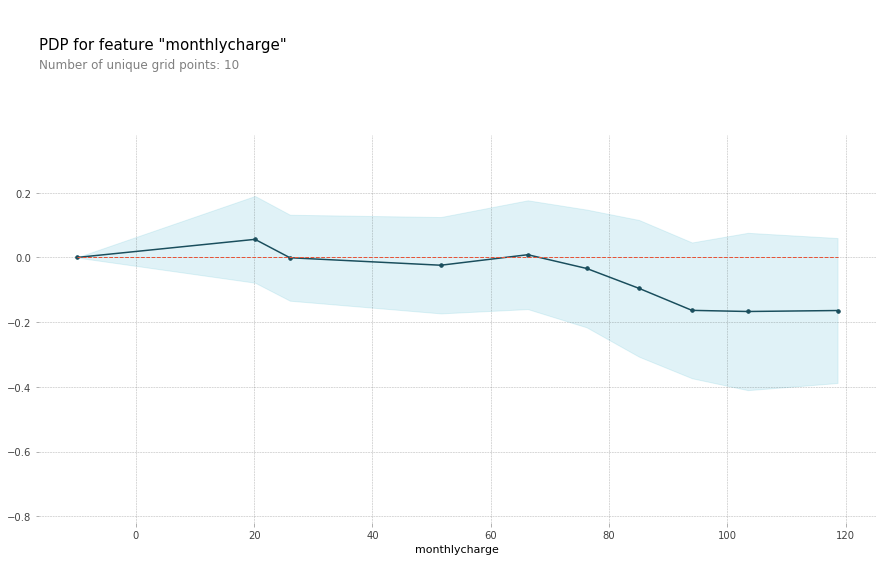

In [80]:
for feat_name in base_features:
    pdp_dist =  pdp.pdp_isolate(model=first_model, dataset=val_X1,
                               model_features=base_features, feature=feat_name)
    pdp.pdp_plot(pdp_dist, feat_name)
    plt.show()

In [81]:
good_model.predict(np.array(X_test.values[0]).reshape(1,-1))

array([1])

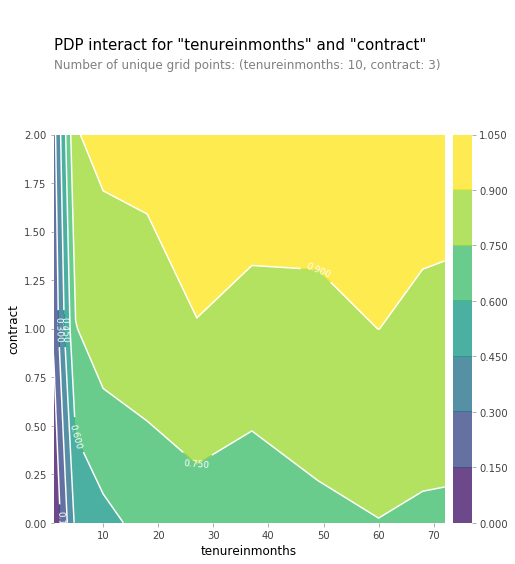

In [82]:
fnames = ['tenureinmonths', 'contract']
partial_plot  =  pdp.pdp_interact(model=first_model, dataset=val_X1,
                                  model_features=base_features, features=fnames)
pdp.pdp_interact_plot(pdp_interact_out=partial_plot,
                      feature_names=fnames, plot_type='contour')
plt.show()

# EVALUATING RANDOM FOREST ON THE BASIS OF IMPORTANT FEATURES

In [83]:
imp_features = ['contract', 'tenureinmonths']
# Specify non-default hyper-parameter values

RandomForestClassifier(max_features=15, max_leaf_nodes=16, n_estimators=50)
Results on test data
Test accuracy =  0.8619
Test precision =  0.8699
Test recall =  0.9492
Classification report:
              precision    recall  f1-score   support

           0       0.83      0.64      0.73       561
           1       0.87      0.95      0.91      1416

    accuracy                           0.86      1977
   macro avg       0.85      0.80      0.82      1977
weighted avg       0.86      0.86      0.86      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  360   201
1   72  1344

ROC curve


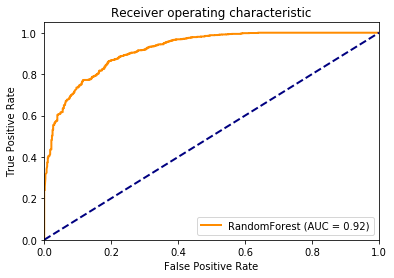

In [84]:
max_features = 15
max_leaf_nodes = 16 
n_estimators = 50
# Train and test model
good_model = RandomForestClassifier(max_leaf_nodes = max_leaf_nodes,
                                    max_features = max_features, 
                                    n_estimators=n_estimators, ) # create model 
print(good_model) # display model parameters
good_model.fit(X_train, y_train) # train model
pred = good_model.predict(X_test) # predicted output for test examples
print("Results on test data")
acc = accuracy_score(y_test, pred) # accuracy on test examples
prec = precision_score(y_test, pred) # precision on test examples
reca = recall_score(y_test, pred) # recall on test examples
print(f'Test accuracy = {acc: .4f}') # round to 4 decimal places
print(f'Test precision = {prec: .4f}') # round to 4 decimal places
print(f'Test recall = {reca: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, pred))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, pred)))
print('\nROC curve')
fpr, tpr, thresholds = roc_curve(y_test, good_model.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='RandomForest (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()